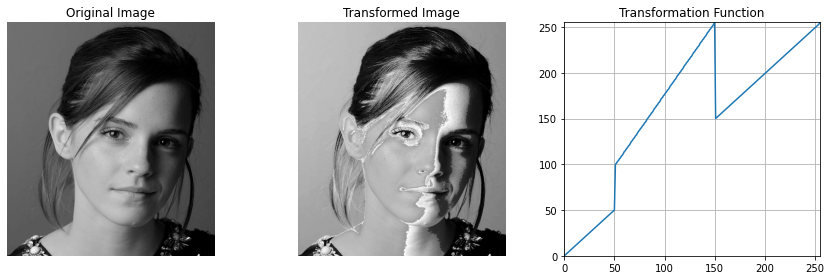

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

c = np.array([(50, 50), (50, 100), (150, 255), (150, 150)])

t1 = np.linspace(0, c[0, 1], c[0, 0] + 1).astype('uint8')   
t2 = np.linspace(c[0, 1], c[1, 1], c[1, 0] - c[0, 0]).astype('uint8') 
t3 = np.linspace(c[1, 1], c[2, 1], c[2, 0] - c[1, 0]).astype('uint8')  
t4 = np.linspace(c[2, 1], c[3, 1], c[3, 0] - c[2, 0]).astype('uint8')  
t5 = np.linspace(c[3, 1], 255, 255 - c[3, 0]).astype('uint8')  

transform = np.concatenate((t1, t2, t3, t4, t5))

f = cv.imread('a1images\emma.jpg', cv.IMREAD_GRAYSCALE)  

g = transform[f]
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(f, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(g, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Transformed Image')
ax[1].axis('off')

ax[2].plot(transform)
ax[2].set_ylim([0, 255])
ax[2].set_xlim([0, 255])
ax[2].set_title('Transformation Function')
ax[2].grid(True) 

plt.tight_layout()
plt.show()


Checking intensities for white matter:
Pixel at (120, 120) has intensity: 182

Checking intensities for gray matter:
Pixel at (145, 95) has intensity: 215


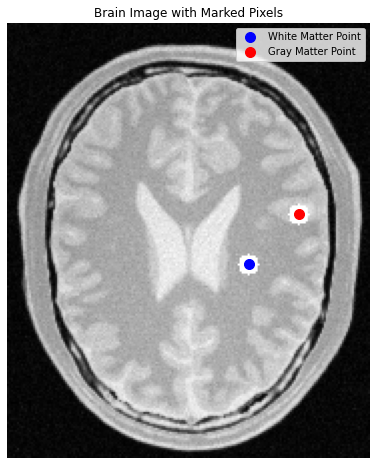

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'D:\EN3166-Image-processing-and-machine-vision\EN3166-Image-processing-and-machine-vision\Image processing assignment\a1images\brain_proton_density_slice.png'
image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)


if image is None:
    print(f"Error: Could not load image from path '{image_path}'. Please check the file path.")
else:

    def get_pixel_intensity(img, coordinates):
        intensities = []
        for coord in coordinates:
            x, y = coord
            intensity = img[y, x]  
            intensities.append((coord, intensity))
            print(f'Pixel at ({x}, {y}) has intensity: {intensity}')
            cv.circle(img, (x, y), 5, (255, 0, 0), -1)  
        return intensities

    white_matter_coords = [(120, 120)]  
    gray_matter_coords = [(145, 95)]    


    print("Checking intensities for white matter:")
    white_matter_intensities = get_pixel_intensity(image, white_matter_coords)

    print("\nChecking intensities for gray matter:")
    gray_matter_intensities = get_pixel_intensity(image, gray_matter_coords)


    plt.figure(figsize=(8, 8))
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.title('Brain Image with Marked Pixels')
    plt.scatter(*zip(*white_matter_coords), color='blue', s=100, label='White Matter Point')  
    plt.scatter(*zip(*gray_matter_coords), color='red', s=100, label='Gray Matter Point')   
    plt.legend()
    plt.axis('off') 
    plt.show()


White Matter Intensity: 166, Range: (154, 177)
Gray Matter Intensity: 215, Range: (199, 230)


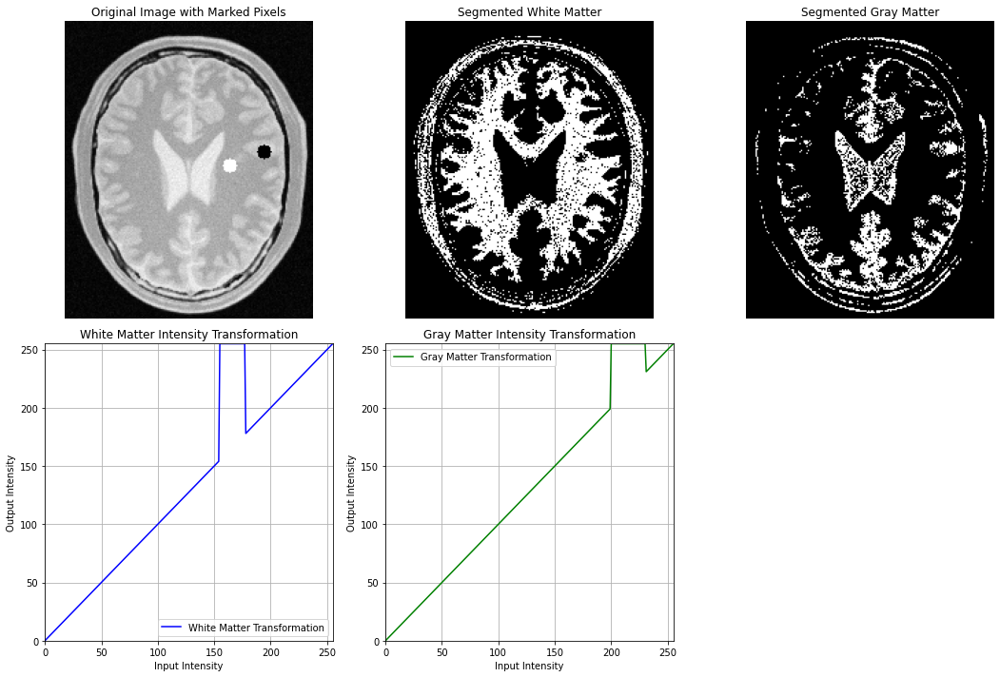

In [7]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'D:\EN3166-Image-processing-and-machine-vision\EN3166-Image-processing-and-machine-vision\Image processing assignment\a1images\brain_proton_density_slice.png'
image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)


if image is None:
    print(f"Error: Could not load image from path '{image_path}'. Please check the file path.")
else:

    white_matter_coords = [(120, 105)] 
    gray_matter_coords = [(145, 95)]    

    range_percent = 7  

    def calculate_intensity_range(intensity):
        lower_bound = int(intensity - (intensity * range_percent / 100))
        upper_bound = int(intensity + (intensity * range_percent / 100))
        return lower_bound, upper_bound

    white_matter_intensity = image[white_matter_coords[0][1], white_matter_coords[0][0]]
    gray_matter_intensity = image[gray_matter_coords[0][1], gray_matter_coords[0][0]]

    white_range = calculate_intensity_range(white_matter_intensity)
    gray_range = calculate_intensity_range(gray_matter_intensity)

    print(f'White Matter Intensity: {white_matter_intensity}, Range: {white_range}')
    print(f'Gray Matter Intensity: {gray_matter_intensity}, Range: {gray_range}')

    white_mask = (image >= white_range[0]) & (image <= white_range[1])
    gray_mask = (image >= gray_range[0]) & (image <= gray_range[1])

    segmented_white = np.zeros_like(image)
    segmented_white[white_mask] = 255 

    segmented_gray = np.zeros_like(image)
    segmented_gray[gray_mask] = 255 

    cv.circle(image, white_matter_coords[0], 5, (255, 0, 0), -1)  
    cv.circle(image, gray_matter_coords[0], 5, (0, 0, 255), -1)  

    t_white = np.zeros(256, dtype=np.uint8)
    t_gray = np.zeros(256, dtype=np.uint8)

    for i in range(256):
        if i <= white_range[0]:
            t_white[i] = i 
        elif i <= white_range[1]:
            t_white[i] = 255  
        else:
            t_white[i] = i  

    for i in range(256):
        if i <= gray_range[0]:
            t_gray[i] = i
        elif i <= gray_range[1]:
            t_gray[i] = 255 
        else:
            t_gray[i] = i 

    plt.figure(figsize=(15, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.title('Original Image with Marked Pixels')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(segmented_white, cmap='gray', vmin=0, vmax=255)
    plt.title('Segmented White Matter')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(segmented_gray, cmap='gray', vmin=0, vmax=255)
    plt.title('Segmented Gray Matter')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.plot(t_white, label='White Matter Transformation', color='blue')
    plt.title('White Matter Intensity Transformation')
    plt.xlabel('Input Intensity')
    plt.ylabel('Output Intensity')
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.grid()
    plt.legend()

    plt.subplot(2, 3, 5)
    plt.plot(t_gray, label='Gray Matter Transformation', color='green')
    plt.title('Gray Matter Intensity Transformation')
    plt.xlabel('Input Intensity')
    plt.ylabel('Output Intensity')
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.grid()
    plt.legend()

    plt.tight_layout()
    plt.show()


White Matter Intensity: 166, Range: (154, 177)
Gray Matter Intensity: 215, Range: (199, 230)
Exclude Intensity: 231, Range: (214, 247)


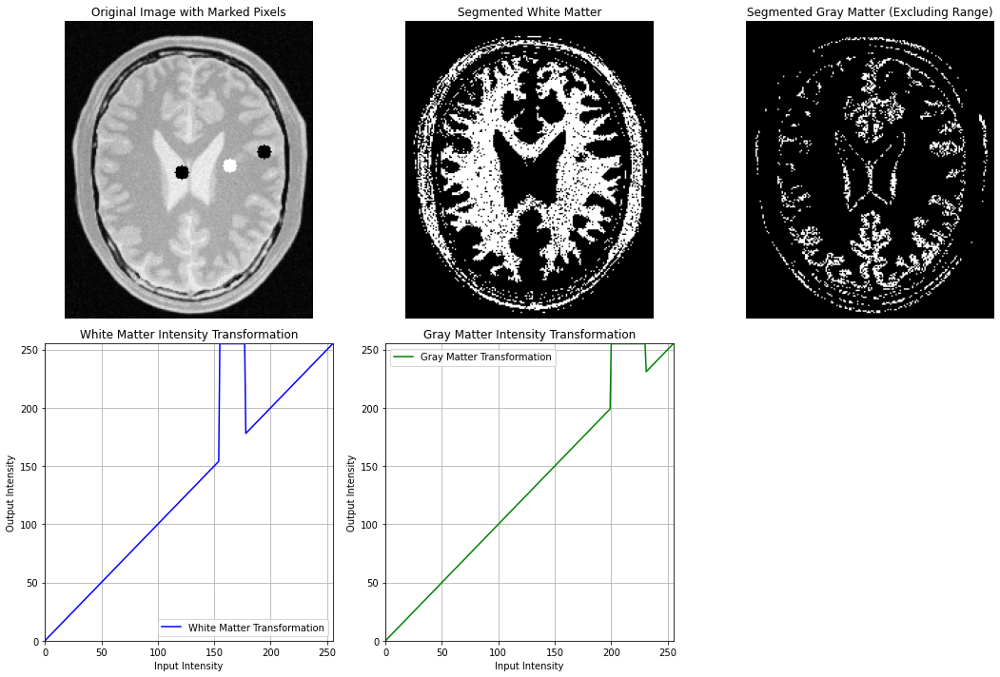

In [8]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\EN3166-Image-processing-and-machine-vision\EN3166-Image-processing-and-machine-vision\Image processing assignment\a1images\brain_proton_density_slice.png'
image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)


if image is None:
    print(f"Error: Could not load image from path '{image_path}'. Please check the file path.")
else:
 
    white_matter_coords = [(120, 105)]  
    gray_matter_coords = [(145, 95)]    
    exclude_gray_coords = [(85, 110)]   
    range_percent = 7 

    def calculate_intensity_range(intensity):
        lower_bound = int(intensity - (intensity * range_percent / 100))
        upper_bound = int(intensity + (intensity * range_percent / 100))
        return lower_bound, upper_bound

    white_matter_intensity = image[white_matter_coords[0][1], white_matter_coords[0][0]]
    gray_matter_intensity = image[gray_matter_coords[0][1], gray_matter_coords[0][0]]
    exclude_gray_intensity = image[exclude_gray_coords[0][1], exclude_gray_coords[0][0]]

    white_range = calculate_intensity_range(white_matter_intensity)
    gray_range = calculate_intensity_range(gray_matter_intensity)
    exclude_gray_range = calculate_intensity_range(exclude_gray_intensity)

    print(f'White Matter Intensity: {white_matter_intensity}, Range: {white_range}')
    print(f'Gray Matter Intensity: {gray_matter_intensity}, Range: {gray_range}')
    print(f'Exclude Intensity: {exclude_gray_intensity}, Range: {exclude_gray_range}')

    white_mask = (image >= white_range[0]) & (image <= white_range[1])
    gray_mask = (image >= gray_range[0]) & (image <= gray_range[1])
    exclude_mask = (image >= exclude_gray_range[0]) & (image <= exclude_gray_range[1])

  
    segmented_white = np.zeros_like(image)
    segmented_white[white_mask] = 255  

    segmented_gray = np.zeros_like(image)
    segmented_gray[gray_mask] = 255 

  
    segmented_gray[exclude_mask] = 0  

    cv.circle(image, white_matter_coords[0], 5, (255, 0, 0), -1) 
    cv.circle(image, gray_matter_coords[0], 5, (0, 0, 255), -1)  
    cv.circle(image, exclude_gray_coords[0], 5, (0, 255, 0), -1) 

    t_white = np.zeros(256, dtype=np.uint8)
    t_gray = np.zeros(256, dtype=np.uint8)

  
    for i in range(256):
        if i <= white_range[0]:
            t_white[i] = i  
        elif i <= white_range[1]:
            t_white[i] = 255 
        else:
            t_white[i] = i 

    for i in range(256):
        if i <= gray_range[0]:
            t_gray[i] = i 
        elif i <= gray_range[1]:
            t_gray[i] = 255 
        else:
            t_gray[i] = i  

    plt.figure(figsize=(15, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.title('Original Image with Marked Pixels')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(segmented_white, cmap='gray', vmin=0, vmax=255)
    plt.title('Segmented White Matter')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(segmented_gray, cmap='gray', vmin=0, vmax=255)
    plt.title('Segmented Gray Matter (Excluding Range)')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.plot(t_white, label='White Matter Transformation', color='blue')
    plt.title('White Matter Intensity Transformation')
    plt.xlabel('Input Intensity')
    plt.ylabel('Output Intensity')
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.grid()
    plt.legend()

    plt.subplot(2, 3, 5)
    plt.plot(t_gray, label='Gray Matter Transformation', color='green')
    plt.title('Gray Matter Intensity Transformation')
    plt.xlabel('Input Intensity')
    plt.ylabel('Output Intensity')
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.grid()
    plt.legend()

    plt.tight_layout()
    plt.show()


White Matter Intensity: 166, Range: (154, 177)
Gray Matter Intensity: 215, Range: (199, 230)
Exclude Intensity: 231, Range: (214, 247)


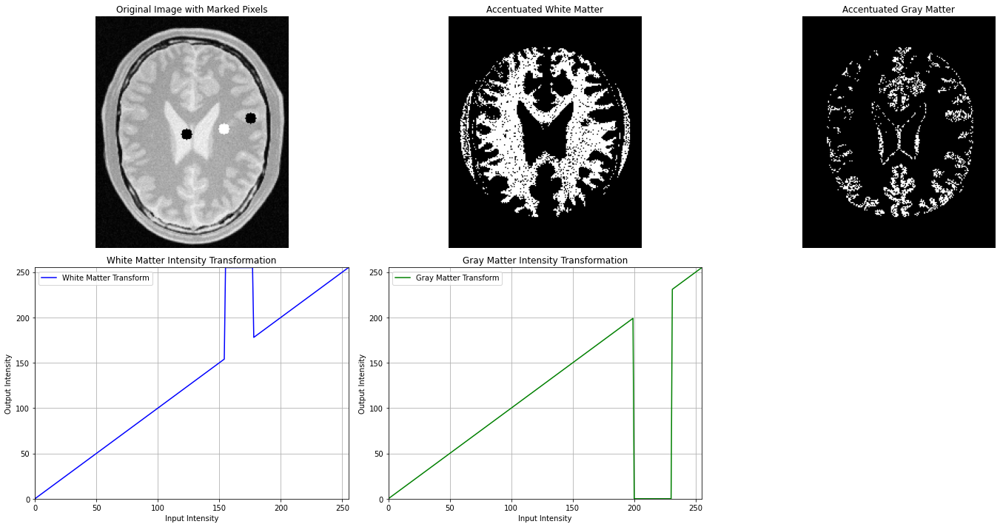

In [9]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'D:\EN3166-Image-processing-and-machine-vision\EN3166-Image-processing-and-machine-vision\Image processing assignment\a1images\brain_proton_density_slice.png'
image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

if image is None:
    print(f"Error: Could not load image from path '{image_path}'. Please check the file path.")
else:

    white_matter_coords = [(120, 105)] 
    gray_matter_coords = [(145, 95)]     
    exclude_gray_coords =  [(85, 110)]   

    range_percent = 7  

    def calculate_intensity_range(intensity):
        lower_bound = int(intensity - (intensity * range_percent / 100))
        upper_bound = int(intensity + (intensity * range_percent / 100))
        return lower_bound, upper_bound

    white_matter_intensity = image[white_matter_coords[0][1], white_matter_coords[0][0]]
    gray_matter_intensity = image[gray_matter_coords[0][1], gray_matter_coords[0][0]]
    exclude_gray_intensity = image[exclude_gray_coords[0][1], exclude_gray_coords[0][0]]

    white_range = calculate_intensity_range(white_matter_intensity)
    gray_range = calculate_intensity_range(gray_matter_intensity)
    exclude_gray_range = calculate_intensity_range(exclude_gray_intensity)

    print(f'White Matter Intensity: {white_matter_intensity}, Range: {white_range}')
    print(f'Gray Matter Intensity: {gray_matter_intensity}, Range: {gray_range}')
    print(f'Exclude Intensity: {exclude_gray_intensity}, Range: {exclude_gray_range}')

 
    white_mask = (image >= white_range[0]) & (image <= white_range[1])
    gray_mask = (image >= gray_range[0]) & (image <= gray_range[1])
    exclude_mask = (image >= exclude_gray_range[0]) & (image <= exclude_gray_range[1])

   
    segmented_white = np.zeros_like(image)
    segmented_white[white_mask] = 255 

    segmented_gray = np.zeros_like(image)
    segmented_gray[gray_mask] = 255  
    segmented_gray[exclude_mask] = 0  

    mask = np.zeros(image.shape, dtype=np.uint8)
    center = (image.shape[1] // 2, image.shape[0] // 2) 
    radius = min(center) - 10  
    cv.circle(mask, center, radius, 255, thickness=-1) 

    segmented_white = cv.bitwise_and(segmented_white, segmented_white, mask=mask)
    segmented_gray = cv.bitwise_and(segmented_gray, segmented_gray, mask=mask)

 
    transformed_white = np.clip(segmented_white * 2, 0, 255).astype(np.uint8)  

  
    transformed_gray = np.clip(segmented_gray * 2, 0, 255).astype(np.uint8)  


    cv.circle(image, white_matter_coords[0], 5, (255, 0, 0), -1)  
    cv.circle(image, gray_matter_coords[0], 5, (0, 0, 255), -1)   
    cv.circle(image, exclude_gray_coords[0], 5, (0, 255, 0), -1)  

    plt.figure(figsize=(20, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.title('Original Image with Marked Pixels')
    plt.axis('off')
    plt.subplot(2, 3, 2)
    plt.imshow(transformed_white, cmap='gray', vmin=0, vmax=255)
    plt.title('Accentuated White Matter')
    plt.axis('off')

 
    plt.subplot(2, 3, 3)
    plt.imshow(transformed_gray, cmap='gray', vmin=0, vmax=255)
    plt.title('Accentuated Gray Matter')
    plt.axis('off')


    plt.subplot(2, 3, 4)
    t_white = np.zeros(256, dtype=np.uint8)
    for i in range(256):
        if i <= white_range[0]:
            t_white[i] = i  
        elif i <= white_range[1]:
            t_white[i] = 255 
        else:
            t_white[i] = i 
    plt.plot(t_white, label='White Matter Transform', color='blue')
    plt.title('White Matter Intensity Transformation')
    plt.xlabel('Input Intensity')
    plt.ylabel('Output Intensity')
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.grid()
    plt.legend()

    
    plt.subplot(2, 3, 5)
    t_gray = np.zeros(256, dtype=np.uint8)
    for i in range(256):
        if i <= gray_range[0]:
            t_gray[i] = i  
        elif i <= gray_range[1]:
            t_gray[i] = 0 
        else:
            t_gray[i] = i  
    plt.plot(t_gray, label='Gray Matter Transform', color='green')
    plt.title('Gray Matter Intensity Transformation')
    plt.xlabel('Input Intensity')
    plt.ylabel('Output Intensity')
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.grid()
    plt.legend()

    plt.tight_layout()
    plt.show()


White Matter Intensity: 166, Range: (152, 179)
Gray Matter Intensity: 215, Range: (197, 232)
Exclude Intensity: 231, Range: (212, 249)


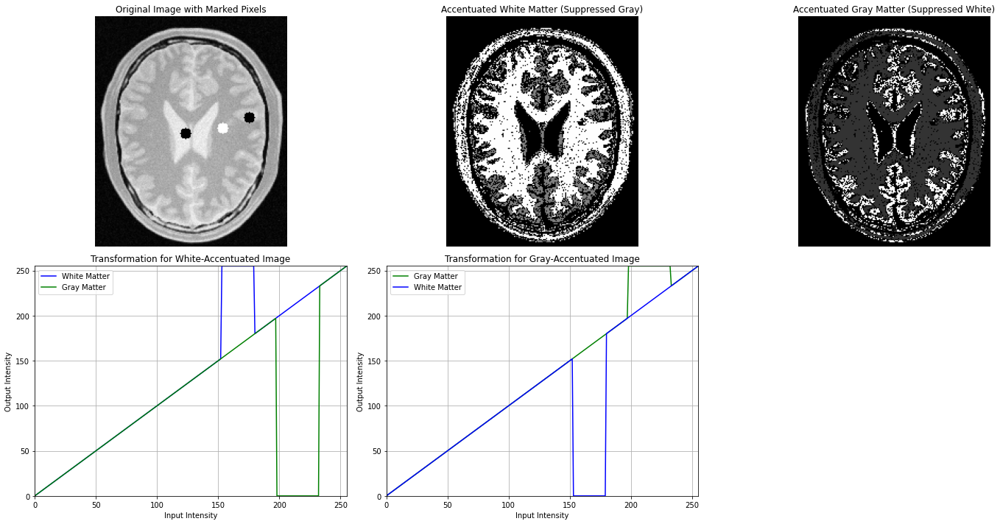

In [10]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\EN3166-Image-processing-and-machine-vision\EN3166-Image-processing-and-machine-vision\Image processing assignment\a1images\brain_proton_density_slice.png'
image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)


if image is None:
    print(f"Error: Could not load image from path '{image_path}'. Please check the file path.")
else:

    white_matter_coords = [(120, 105)] 
    gray_matter_coords = [(145, 95)]   
    exclude_gray_coords = [(85, 110)]   
 
    range_percent = 8 


    def calculate_intensity_range(intensity):
        lower_bound = int(intensity - (intensity * range_percent / 100))
        upper_bound = int(intensity + (intensity * range_percent / 100))
        return lower_bound, upper_bound

    white_matter_intensity = image[white_matter_coords[0][1], white_matter_coords[0][0]]
    gray_matter_intensity = image[gray_matter_coords[0][1], gray_matter_coords[0][0]]
    exclude_gray_intensity = image[exclude_gray_coords[0][1], exclude_gray_coords[0][0]]

    white_range = calculate_intensity_range(white_matter_intensity)
    gray_range = calculate_intensity_range(gray_matter_intensity)
    exclude_gray_range = calculate_intensity_range(exclude_gray_intensity)

    print(f'White Matter Intensity: {white_matter_intensity}, Range: {white_range}')
    print(f'Gray Matter Intensity: {gray_matter_intensity}, Range: {gray_range}')
    print(f'Exclude Intensity: {exclude_gray_intensity}, Range: {exclude_gray_range}')

    # Create masks
    white_mask = (image >= white_range[0]) & (image <= white_range[1])
    gray_mask = (image >= gray_range[0]) & (image <= gray_range[1])
    exclude_mask = (image >= exclude_gray_range[0]) & (image <= exclude_gray_range[1])

  
    segmented_white = np.zeros_like(image)
    segmented_white[white_mask] = 255  

    segmented_gray = np.zeros_like(image)
    segmented_gray[gray_mask] = 255  
    segmented_gray[exclude_mask] = 0  

    
    transformed_white = np.clip(segmented_white * 2, 0, 255).astype(np.uint8)  
    transformed_white_gray_suppressed = np.clip(segmented_gray * 0.5, 0, 255).astype(np.uint8)  

    
    transformed_combined_white = cv.addWeighted(transformed_white, 1, transformed_white_gray_suppressed, 1, 0)

   
    transformed_gray = np.clip(segmented_gray * 2.5, 0, 255).astype(np.uint8)  
    transformed_gray_white_suppressed = np.clip(segmented_white * 0.2, 0, 255).astype(np.uint8)  

    
    transformed_combined_gray = cv.addWeighted(transformed_gray, 1, transformed_gray_white_suppressed, 1, 0)

    cv.circle(image, white_matter_coords[0], 5, (255, 0, 0), -1)  
    cv.circle(image, gray_matter_coords[0], 5, (0, 0, 255), -1)   
    cv.circle(image, exclude_gray_coords[0], 5, (0, 255, 0), -1)  

 
    plt.figure(figsize=(20, 10))

    
    plt.subplot(2, 3, 1)
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.title('Original Image with Marked Pixels')
    plt.axis('off')

   
    plt.subplot(2, 3, 2)
    plt.imshow(transformed_combined_white, cmap='gray', vmin=0, vmax=255)
    plt.title('Accentuated White Matter (Suppressed Gray)')
    plt.axis('off')

    
    plt.subplot(2, 3, 3)
    plt.imshow(transformed_combined_gray, cmap='gray', vmin=0, vmax=255)
    plt.title('Accentuated Gray Matter (Suppressed White)')
    plt.axis('off')

    
    plt.subplot(2, 3, 4)
    t_white = np.zeros(256, dtype=np.uint8)
    t_gray = np.zeros(256, dtype=np.uint8)
    
   
    for i in range(256):
        if i <= white_range[0]:
            t_white[i] = i  
        elif i <= white_range[1]:
            t_white[i] = 255  
        else:
            t_white[i] = i  
        
        if i <= gray_range[0]:
            t_gray[i] = i  
        elif i <= gray_range[1]:
            t_gray[i] = 0  
        else:
            t_gray[i] = i  

    plt.plot(t_white, label='White Matter', color='blue')
    plt.plot(t_gray, label='Gray Matter', color='green')
    plt.title('Transformation for White-Accentuated Image')
    plt.xlabel('Input Intensity')
    plt.ylabel('Output Intensity')
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.grid()
    plt.legend()

   
    plt.subplot(2, 3, 5)
    t_white_suppressed = np.zeros(256, dtype=np.uint8)
    t_gray_accentuated = np.zeros(256, dtype=np.uint8)

  
    for i in range(256):
        if i <= gray_range[0]:
            t_gray_accentuated[i] = i  
        elif i <= gray_range[1]:
            t_gray_accentuated[i] = 255  
        else:
            t_gray_accentuated[i] = i   
        
        if i <= white_range[0]:
            t_white_suppressed[i] = i 
        elif i <= white_range[1]:
            t_white_suppressed[i] = 0  
        else:
            t_white_suppressed[i] = i  

    plt.plot(t_gray_accentuated, label='Gray Matter', color='green')
    plt.plot(t_white_suppressed, label='White Matter', color='blue')
    plt.title('Transformation for Gray-Accentuated Image')
    plt.xlabel('Input Intensity')
    plt.ylabel('Output Intensity')
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.grid()
    plt.legend()

    plt.tight_layout()
    plt.show()


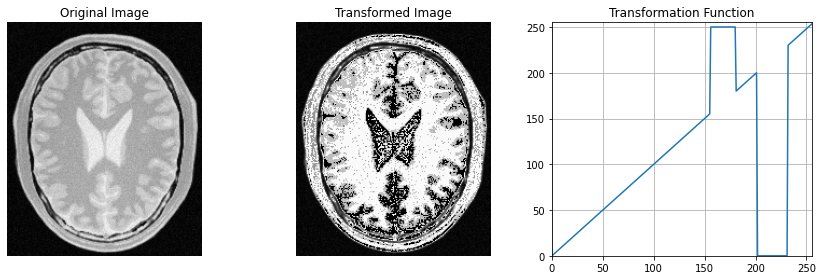

In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


c = np.array([(0, 0), (155, 155), (180, 250), (200, 200), (230, 0), (255, 255)])

t1 = np.linspace(c[0, 1], c[1, 1], c[1, 0] - c[0, 0] + 1).astype('uint8')  
t2 = np.full(c[2, 0] - c[1, 0], 250).astype('uint8') 
t3 = np.linspace(180, 200, 200 - 180 + 1).astype('uint8')  
t4 = np.full(c[4, 0] - c[3, 0], 0).astype('uint8')  
t5 = np.linspace(230, 255, 255 - 230 + 1).astype('uint8')  
transform = np.concatenate((t1, t2, t3, t4, t5))

img_path = r'D:\EN3166-Image-processing-and-machine-vision\EN3166-Image-processing-and-machine-vision\Image processing assignment\a1images\brain_proton_density_slice.png'
f = cv.imread(img_path, cv.IMREAD_GRAYSCALE)  

g = transform[f]
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(f, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(g, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Transformed Image')
ax[1].axis('off')

ax[2].plot(transform)
ax[2].set_ylim([0, 255])
ax[2].set_xlim([0, 255])
ax[2].set_title('Transformation Function')
ax[2].grid(True) 

plt.tight_layout()
plt.show()


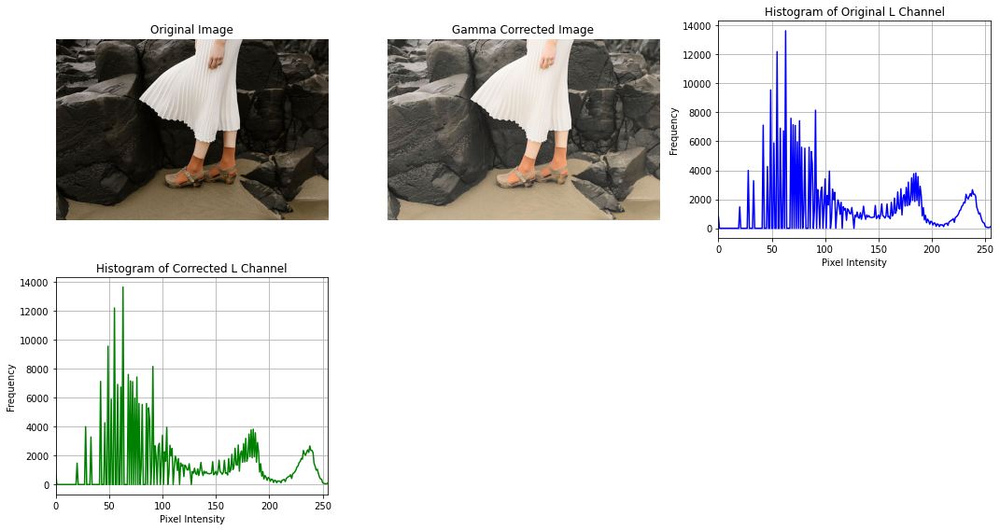

Gamma value used for correction: 2.2


In [12]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'a1images\highlights_and_shadows.jpg'
image = cv.imread(image_path)


lab_image = cv.cvtColor(image, cv.COLOR_BGR2Lab)
L_channel = lab_image[:, :, 0] 

gamma = 2.2 

L_corrected = np.array(255 * (L_channel / 255) ** (1 / gamma), dtype=np.uint8)

lab_image[:, :, 0] = L_corrected
corrected_image = cv.cvtColor(lab_image, cv.COLOR_Lab2BGR)

original_hist = cv.calcHist([L_channel], [0], None, [256], [0, 256])
corrected_hist = cv.calcHist([L_corrected], [0], None, [256], [0, 256])

plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')


plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(corrected_image, cv.COLOR_BGR2RGB))
plt.title('Gamma Corrected Image')
plt.axis('off')


plt.subplot(2, 3, 3)
plt.plot(original_hist, color='blue', label='Original Histogram')
plt.title('Histogram of Original L Channel')
plt.xlim(0, 255)
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid()

plt.subplot(2, 3, 4)
plt.plot(corrected_hist, color='green', label='Corrected Histogram')
plt.title('Histogram of Corrected L Channel')
plt.xlim(0, 255)
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid()

plt.tight_layout()
plt.show()

print(f"Gamma value used for correction: {gamma}")


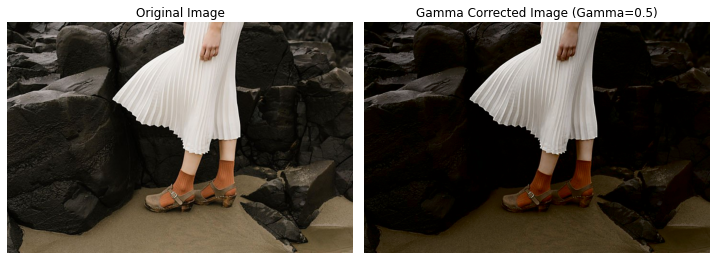

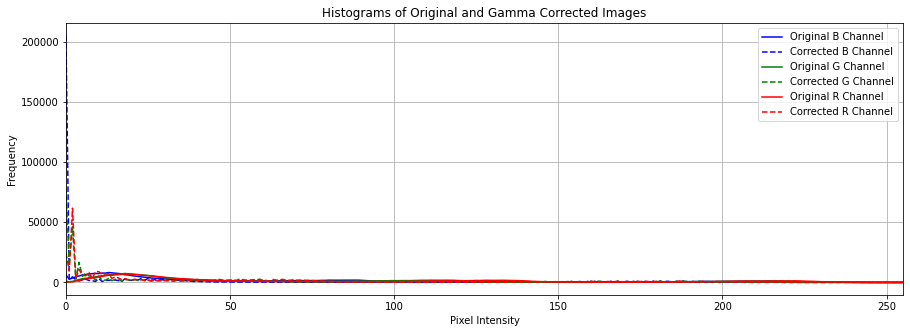

Gamma value used for correction: 0.5


In [13]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'a1images\highlights_and_shadows.jpg' 
image = cv.imread(image_path)

if image is None:
    print(f"Error: Could not load image from path '{image_path}'. Please check the file path.")
else:
 
    lab_image = cv.cvtColor(image, cv.COLOR_BGR2Lab)
    L_channel = lab_image[:, :, 0]  

    gamma = 0.5  


    L_corrected = np.array(255 * (L_channel / 255) ** (1 / gamma), dtype=np.uint8)

    lab_image[:, :, 0] = L_corrected
    corrected_image = cv.cvtColor(lab_image, cv.COLOR_Lab2BGR)

    plt.figure(figsize=(15, 8))

    plt.subplot(2, 3, 1)
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(cv.cvtColor(corrected_image, cv.COLOR_BGR2RGB))
    plt.title('Gamma Corrected Image (Gamma=0.5)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    colors = ('b', 'g', 'r')
    plt.figure(figsize=(15, 5))
    for i, color in enumerate(colors):
        hist_orig = cv.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist_orig, color=color, label=f'Original {color.upper()} Channel')

 
        hist_corr = cv.calcHist([corrected_image], [i], None, [256], [0, 256])
        plt.plot(hist_corr, color=color, linestyle='dashed', label=f'Corrected {color.upper()} Channel')

    plt.title('Histograms of Original and Gamma Corrected Images')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.xlim(0, 255)
    plt.grid()
    plt.legend()
    plt.show()


    print(f"Gamma value used for correction: {gamma}")


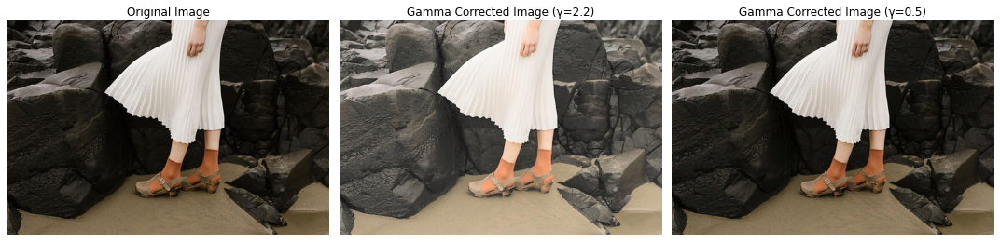

In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'a1images\highlights_and_shadows.jpg'
image = cv.imread(image_path)

lab_image = cv.cvtColor(image, cv.COLOR_BGR2Lab)
L_channel = lab_image[:, :, 0] 

gamma_values = [2.2, 0.5]
corrected_images = []

for gamma in gamma_values:
    L_corrected = np.array(255 * (L_channel / 255) ** (1 / gamma), dtype=np.uint8)
    

    lab_image[:, :, 0] = L_corrected
    corrected_images.append(cv.cvtColor(lab_image, cv.COLOR_Lab2BGR))

plt.figure(figsize=(15, 8))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

for i, corrected_image in enumerate(corrected_images):
    plt.subplot(1, 3, i + 2)
    plt.imshow(cv.cvtColor(corrected_image, cv.COLOR_BGR2RGB))
    plt.title(f'Gamma Corrected Image (γ={gamma_values[i]})')
    plt.axis('off')

plt.tight_layout()
plt.show()


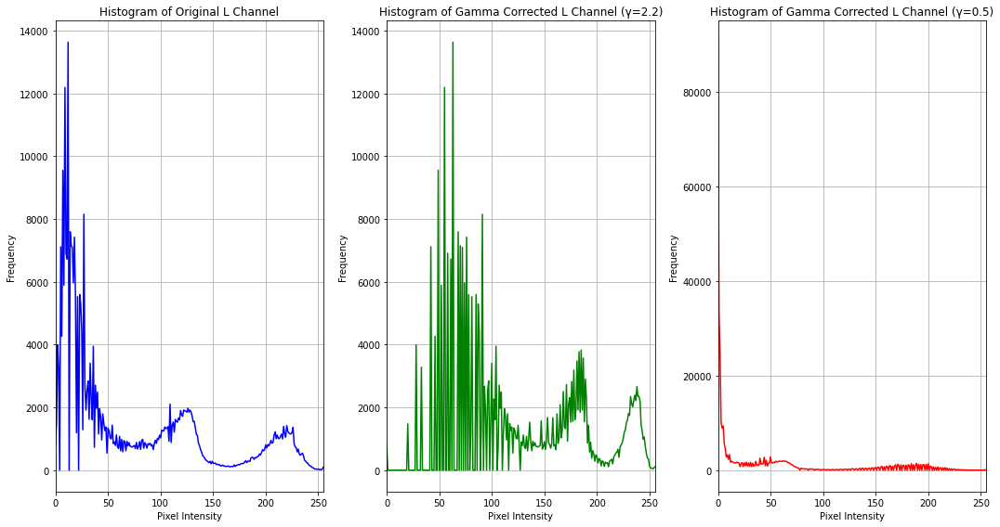

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'a1images\highlights_and_shadows.jpg'
image = cv.imread(image_path)


lab_image = cv.cvtColor(image, cv.COLOR_BGR2Lab)
L_channel = lab_image[:, :, 0]

gamma_values = [2.2, 0.5]
histograms = []

original_hist = cv.calcHist([L_channel], [0], None, [256], [0, 256])
histograms.append(original_hist)

for gamma in gamma_values:
    L_corrected = np.array(255 * (L_channel / 255) ** (1 / gamma), dtype=np.uint8)
    corrected_hist = cv.calcHist([L_corrected], [0], None, [256], [0, 256])
    histograms.append(corrected_hist)

plt.figure(figsize=(15, 8))

plt.subplot(1, 3, 1)
plt.plot(histograms[0], color='blue', label='Original Histogram')
plt.title('Histogram of Original L Channel')
plt.xlim(0, 255)
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(histograms[1], color='green', label='Gamma = 2.2 Histogram')
plt.title('Histogram of Gamma Corrected L Channel (γ=2.2)')
plt.xlim(0, 255)
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(histograms[2], color='red', label='Gamma = 0.5 Histogram')
plt.title('Histogram of Gamma Corrected L Channel (γ=0.5)')
plt.xlim(0, 255)
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid()

plt.tight_layout()
plt.show()


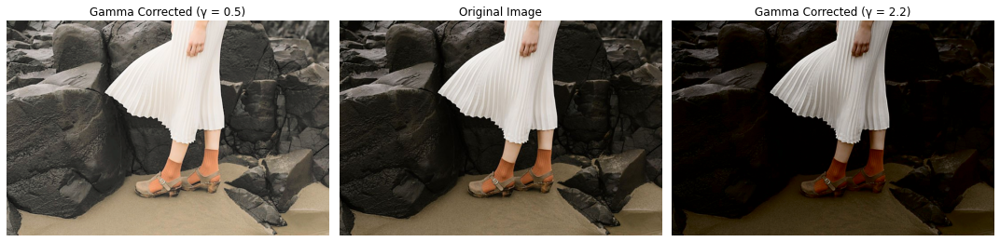

In [16]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'a1images\highlights_and_shadows.jpg'
image = cv.imread(image_path)

lab_img = cv.cvtColor(image, cv.COLOR_BGR2Lab)

L, A, B = cv.split(lab_img)

L = L / 255.0

gamma_low = 0.5
L_gamma_corrected_low = np.power(L, gamma_low)
L_gamma_corrected_low = np.uint8(L_gamma_corrected_low * 255)
lab_gamma_corrected_low = cv.merge((L_gamma_corrected_low, A, B))
gamma_corrected_img_low = cv.cvtColor(lab_gamma_corrected_low, cv.COLOR_Lab2BGR)

gamma_high = 2.2
L_gamma_corrected_high = np.power(L, gamma_high)
L_gamma_corrected_high = np.uint8(L_gamma_corrected_high * 255)
lab_gamma_corrected_high = cv.merge((L_gamma_corrected_high, A, B))
gamma_corrected_img_high = cv.cvtColor(lab_gamma_corrected_high, cv.COLOR_Lab2BGR)


fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

axs[1].set_title("Original Image")
axs[1].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
axs[1].axis('off')

axs[0].set_title("Gamma Corrected (γ = 0.5)")
axs[0].imshow(cv.cvtColor(gamma_corrected_img_low, cv.COLOR_BGR2RGB))
axs[0].axis('off')

axs[2].set_title("Gamma Corrected (γ = 2.2)")
axs[2].imshow(cv.cvtColor(gamma_corrected_img_high, cv.COLOR_BGR2RGB))
axs[2].axis('off')

plt.tight_layout()
plt.show()


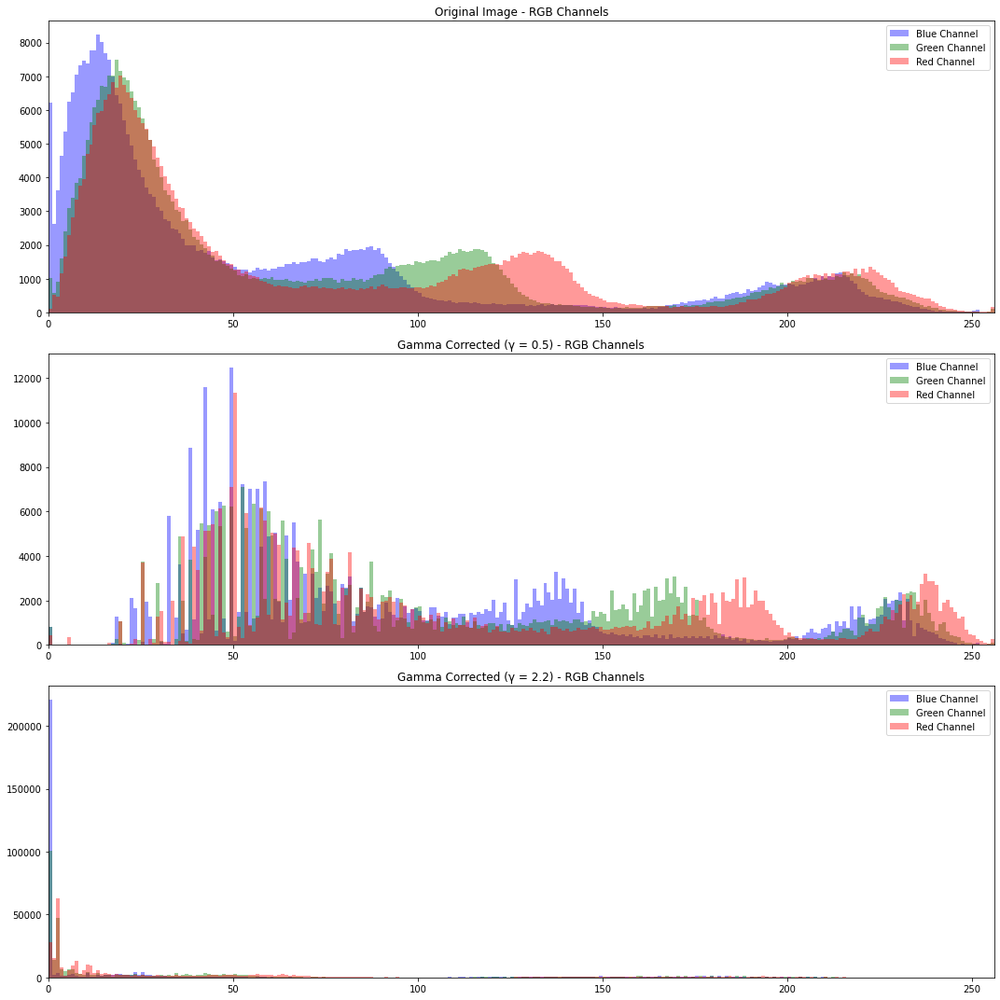

In [17]:

def plot_histograms(original_image, corrected_image_low, corrected_image_high):

    b_orig, g_orig, r_orig = cv.split(original_image)

    b_low, g_low, r_low = cv.split(corrected_image_low)
    b_high, g_high, r_high = cv.split(corrected_image_high)

    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(15, 15))

    axs[0].set_title("Original Image - RGB Channels")
    axs[0].hist(b_orig.ravel(), bins=256, range=[0, 256], color='b', alpha=0.4, label='Blue Channel')
    axs[0].hist(g_orig.ravel(), bins=256, range=[0, 256], color='g', alpha=0.4, label='Green Channel')
    axs[0].hist(r_orig.ravel(), bins=256, range=[0, 256], color='r', alpha=0.4, label='Red Channel')
    axs[0].set_xlim([0, 256])
    axs[0].legend()

    axs[1].set_title("Gamma Corrected (γ = 0.5) - RGB Channels")
    axs[1].hist(b_low.ravel(), bins=256, range=[0, 256], color='b', alpha=0.4, label='Blue Channel')
    axs[1].hist(g_low.ravel(), bins=256, range=[0, 256], color='g', alpha=0.4, label='Green Channel')
    axs[1].hist(r_low.ravel(), bins=256, range=[0, 256], color='r', alpha=0.4, label='Red Channel')
    axs[1].set_xlim([0, 256])
    axs[1].legend()

    axs[2].set_title("Gamma Corrected (γ = 2.2) - RGB Channels")
    axs[2].hist(b_high.ravel(), bins=256, range=[0, 256], color='b', alpha=0.4, label='Blue Channel')
    axs[2].hist(g_high.ravel(), bins=256, range=[0, 256], color='g', alpha=0.4, label='Green Channel')
    axs[2].hist(r_high.ravel(), bins=256, range=[0, 256], color='r', alpha=0.4, label='Red Channel')
    axs[2].set_xlim([0, 256])
    axs[2].legend()

    plt.tight_layout()
    plt.show()

plot_histograms(image, gamma_corrected_img_low, gamma_corrected_img_high)


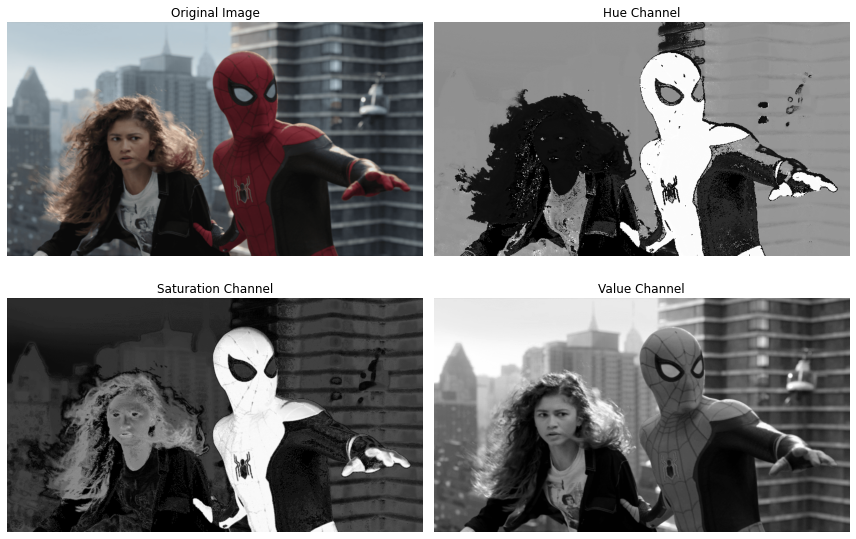

In [18]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = r'a1images/spider.png'
image = cv.imread(image_path)

hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)


hue_channel = hsv_image[:, :, 0]   
saturation_channel = hsv_image[:, :, 1]  
value_channel = hsv_image[:, :, 2]    

fig, ax = plt.subplots(2, 2, figsize=(12, 8))
ax[0, 0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
ax[0, 0].set_title('Original Image')
ax[0, 0].axis('off')

ax[0, 1].imshow(hue_channel, cmap='gray')
ax[0, 1].set_title('Hue Channel')
ax[0, 1].axis('off')

ax[1, 0].imshow(saturation_channel, cmap='gray')
ax[1, 0].set_title('Saturation Channel')
ax[1, 0].axis('off')

ax[1, 1].imshow(value_channel, cmap='gray')
ax[1, 1].set_title('Value Channel')
ax[1, 1].axis('off')

plt.tight_layout()
plt.show()


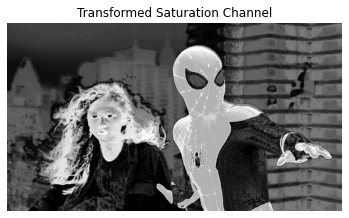

In [19]:
a = 0.5  
sigma = 70

def intensity_transformation(saturation, a, sigma):
    x = saturation.astype(np.float32)  
    mu = np.min(x)  
    transformed_saturation = np.minimum(mu + a*128*np.exp(-(x-128)**2/(2*sigma**2)), 255)
    return transformed_saturation.astype(np.uint8) 

transformed_saturation = intensity_transformation(saturation_channel, a, sigma)


plt.figure(figsize=(6, 6))
plt.imshow(transformed_saturation, cmap='gray')
plt.title('Transformed Saturation Channel')
plt.axis('off')
plt.show()


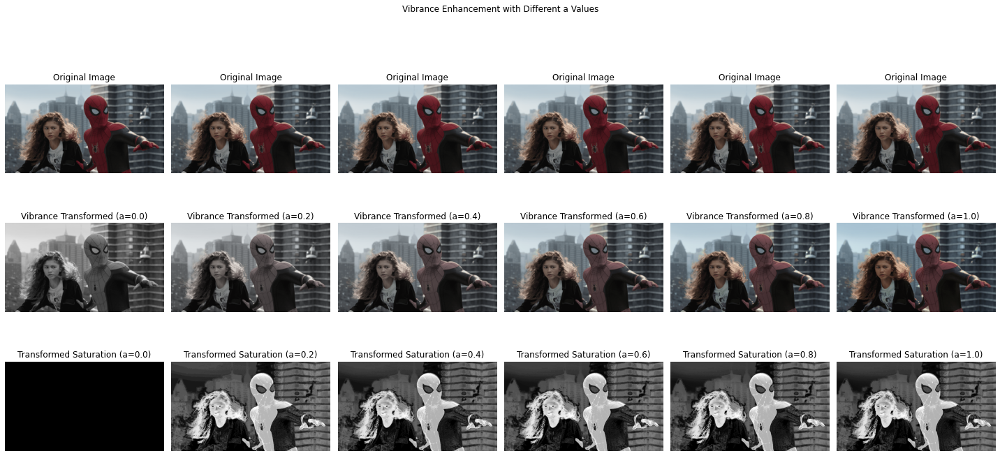

In [20]:

image_path = r'a1images/spider.png'
image = cv.imread(image_path)

hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)

hue_channel = hsv_image[:, :, 0]  
saturation_channel = hsv_image[:, :, 1]  
value_channel = hsv_image[:, :, 2]  

sigma = 70

a_values = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]  


fig, axes = plt.subplots(3, len(a_values), figsize=(20, 10))
fig.suptitle('Vibrance Enhancement with Different a Values')

for idx, a in enumerate(a_values):
    transformed_saturation = intensity_transformation(saturation_channel, a, sigma)

    hsv_corrected = cv.merge((hue_channel, transformed_saturation, value_channel))
    vibrance_image = cv.cvtColor(hsv_corrected, cv.COLOR_HSV2BGR)


    axes[0, idx].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    axes[0, idx].set_title('Original Image')
    axes[0, idx].axis('off')

    axes[1, idx].imshow(cv.cvtColor(vibrance_image, cv.COLOR_BGR2RGB))
    axes[1, idx].set_title(f'Vibrance Transformed (a={a})')
    axes[1, idx].axis('off')

    axes[2, idx].imshow(transformed_saturation, cmap='gray')
    axes[2, idx].set_title(f'Transformed Saturation (a={a})')
    axes[2, idx].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()


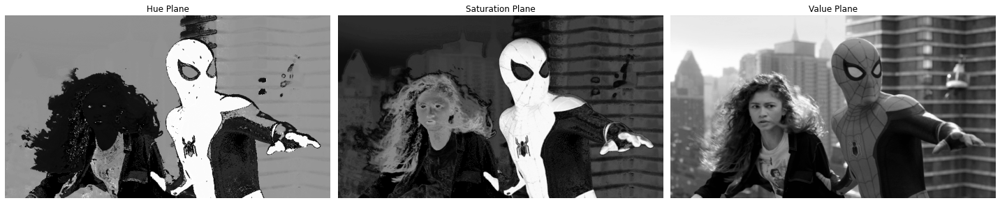

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

spiderman_img = cv2.imread('a1images/spider.png')

hsv_spiderman_img = cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2HSV)

spiderman_hue_plane = hsv_spiderman_img[:, :, 0]
spiderman_saturation_plane = hsv_spiderman_img[:, :, 1]
spiderman_value_plane = hsv_spiderman_img[:, :, 2]
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

axs[0].imshow(spiderman_hue_plane, cmap='gray')
axs[0].set_title('Hue Plane')
axs[0].axis('off')

axs[1].imshow(spiderman_saturation_plane, cmap='gray')
axs[1].set_title('Saturation Plane')
axs[1].axis('off')

axs[2].imshow(spiderman_value_plane, cmap='gray')
axs[2].set_title('Value Plane')
axs[2].axis('off')

plt.tight_layout()
plt.show()


In [22]:
import math

def vibrancy_transformation_pix(input_pix_val: int, a: float, sigma: int = 70) -> float:
    x = input_pix_val
    return min(x + a * 128 * math.exp(-((x - 128) ** 2) / (2 * sigma ** 2)), 255)

new_spiderman_saturation_plane = np.zeros(spiderman_saturation_plane.shape, dtype=np.uint8)

for i in range(spiderman_saturation_plane.shape[0]):
    for j in range(spiderman_saturation_plane.shape[1]):
        new_spiderman_saturation_plane[i, j] = vibrancy_transformation_pix(spiderman_saturation_plane[i, j], a=a)

new_hsv_spiderman_img = cv2.merge((spiderman_hue_plane, new_spiderman_saturation_plane, spiderman_value_plane))


new_spiderman_img = cv2.cvtColor(new_hsv_spiderman_img, cv2.COLOR_HSV2BGR)


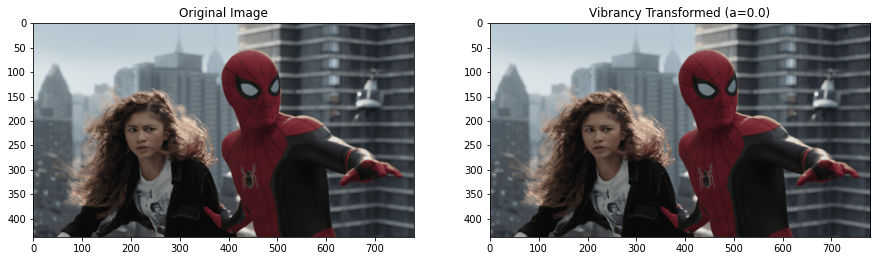

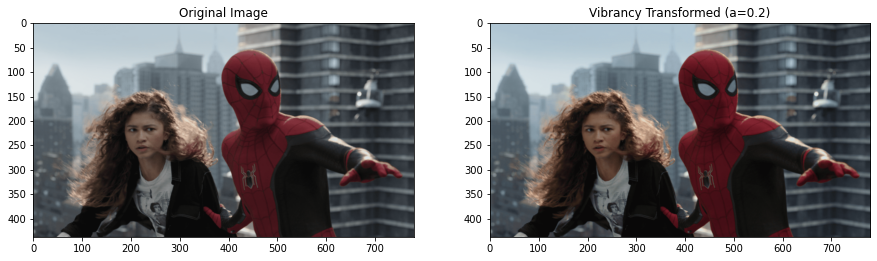

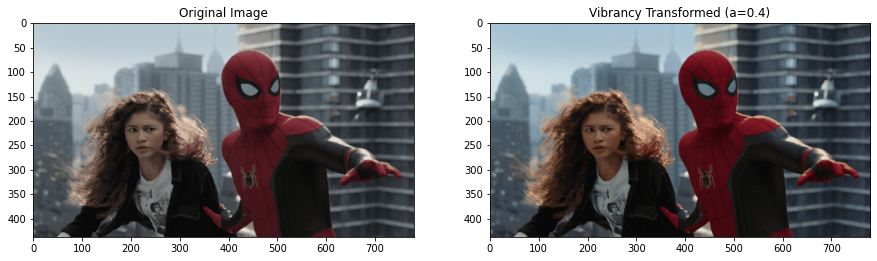

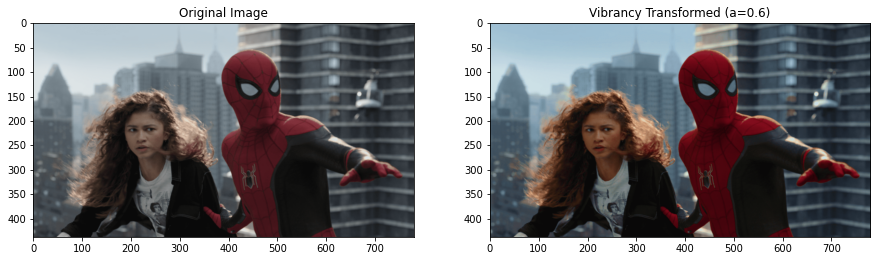

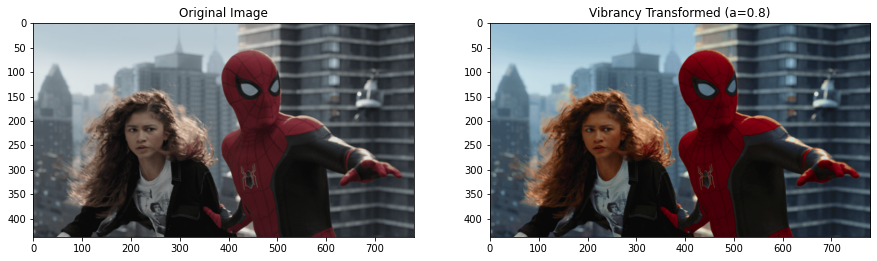

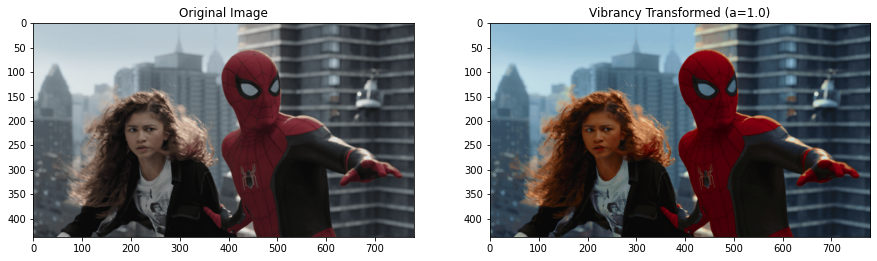

In [23]:
a_values = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]  

hsv_images = {}

for a in a_values:
    new_spiderman_saturation_plane = np.zeros(spiderman_saturation_plane.shape, dtype=np.uint8)

    for i in range(spiderman_saturation_plane.shape[0]):
        for j in range(spiderman_saturation_plane.shape[1]):
            new_spiderman_saturation_plane[i, j] = vibrancy_transformation_pix(spiderman_saturation_plane[i, j], a=a)

    new_hsv_spiderman_img = cv2.merge((spiderman_hue_plane, new_spiderman_saturation_plane, spiderman_value_plane))
    new_spiderman_img = cv2.cvtColor(new_hsv_spiderman_img, cv2.COLOR_HSV2BGR)
    

    hsv_images[a] = new_spiderman_img

    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))
    axs[0].imshow(cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Original Image")
    axs[1].imshow(cv2.cvtColor(new_spiderman_img, cv2.COLOR_BGR2RGB))
    axs[1].set_title(f"Vibrancy Transformed (a={a})")
    plt.show()


In [24]:
hsv_spiderman_img = cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2HSV)

spiderman_hue_plane = hsv_spiderman_img[:, :, 0]
spiderman_saturation_plane = hsv_spiderman_img[:, :, 1]
spiderman_value_plane = hsv_spiderman_img[:, :, 2]

def vibrancy_transformation_pix(input_pix_val: int, a: float, sigma: int = 70) -> float:
    x = input_pix_val
    return min(x + a * 128 * math.exp(-((x - 128) ** 2) / (2 * sigma ** 2)), 255)

a = 0.2
new_spiderman_saturation_plane = np.zeros(spiderman_saturation_plane.shape, dtype=np.uint8)


for i in range(spiderman_saturation_plane.shape[0]):
    for j in range(spiderman_saturation_plane.shape[1]):
        new_spiderman_saturation_plane[i, j] = vibrancy_transformation_pix(spiderman_saturation_plane[i, j], a=a)

new_hsv_spiderman_img = cv2.merge((spiderman_hue_plane, new_spiderman_saturation_plane, spiderman_value_plane))

vibrance_enhanced_img = cv2.cvtColor(new_hsv_spiderman_img, cv2.COLOR_HSV2BGR)

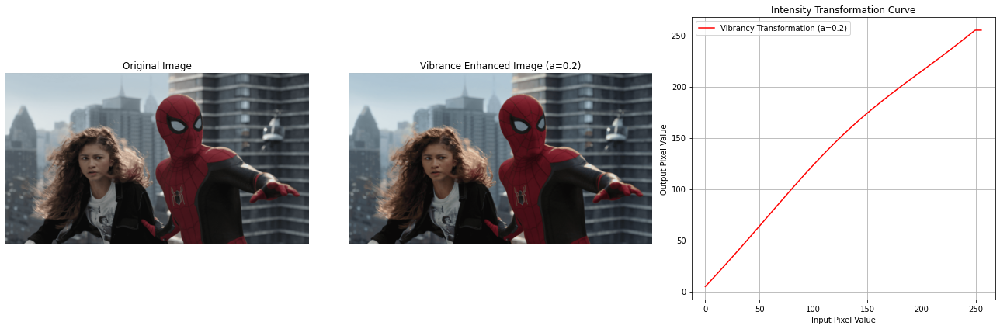

In [25]:
input_values = np.arange(0, 256)
output_values = [vibrancy_transformation_pix(x, a, sigma=70) for x in input_values]


fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].imshow(cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2RGB))
axs[0].set_title('Original Image')
axs[0].axis('off')


axs[1].imshow(cv2.cvtColor(vibrance_enhanced_img, cv2.COLOR_BGR2RGB))
axs[1].set_title('Vibrance Enhanced Image (a=0.2)')
axs[1].axis('off')

axs[2].plot(input_values, output_values, label=f'Vibrancy Transformation (a=0.2)', color='red')
axs[2].set_title('Intensity Transformation Curve')
axs[2].set_xlabel('Input Pixel Value')
axs[2].set_ylabel('Output Pixel Value')
axs[2].grid(True)
axs[2].legend()

plt.tight_layout()
plt.show()


## 5


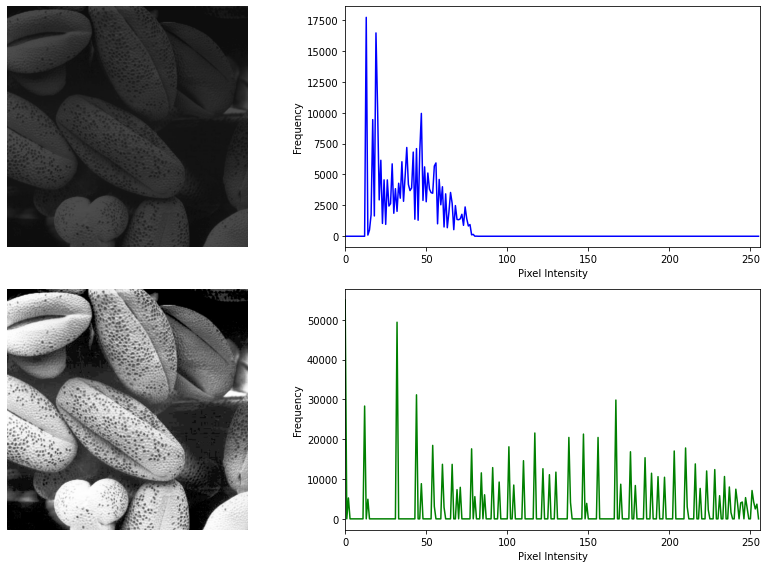

In [26]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def hist_eq(img):
    h, _ = np.histogram(img.flatten(), 256, [0, 256])
    cdf = h.cumsum()
    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')
    return cdf[img]

def hist_eq_custom(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    eq_img = hist_eq(gray)
    hist = np.histogram(gray.flatten(), 256, [0, 256])[0]
    return gray, eq_img, hist

def plot_img_and_hist(orig_img, eq_img, orig_hist):
    eq_hist = np.histogram(eq_img.flatten(), 256, [0, 256])[0]

    plt.figure(figsize=(12, 8))
    plt.subplot(221)
    plt.imshow(orig_img, cmap='gray')
    plt.axis('off')
    plt.subplot(222)
    plt.plot(orig_hist, color='blue')
    plt.xlim([0, 256])
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

    plt.subplot(223)
    plt.imshow(eq_img, cmap='gray')
    plt.axis('off')
    plt.subplot(224)
    plt.plot(eq_hist, color='green')
    plt.xlim([0, 256])
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

img_path = "a1images/shells.tif"
orig_img, eq_img, orig_hist = hist_eq_custom(img_path)
plot_img_and_hist(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB), cv2.cvtColor(eq_img, cv2.COLOR_BGR2RGB), orig_hist)


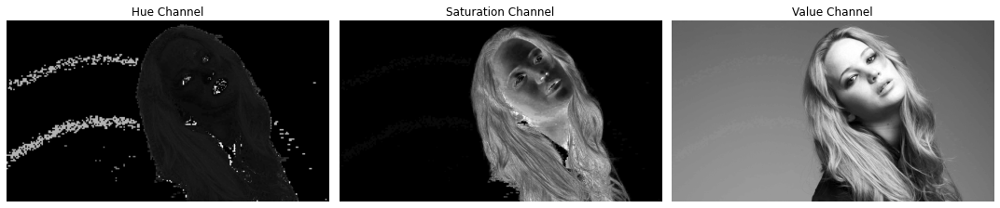

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


img_path = "a1images/jeniffer.jpg"
img = cv2.imread(img_path)


hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)


hue_channel = hsv_img[:, :, 0]
saturation_channel = hsv_img[:, :, 1]
value_channel = hsv_img[:, :, 2]

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Hue Channel")
plt.imshow(hue_channel, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Saturation Channel")
plt.imshow(saturation_channel, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Value Channel")
plt.imshow(value_channel, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


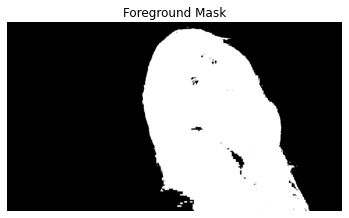

In [44]:
threshold_value = 15  
_, mask = cv2.threshold(saturation_plane, threshold_value, 255, cv2.THRESH_BINARY)
foreground_mask = saturation_channel > 15


plt.figure(figsize=(6, 6))
plt.imshow(mask, cmap='gray')
plt.title('Foreground Mask')
plt.axis('off')
plt.show()


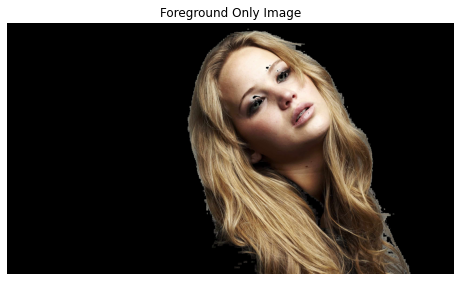

In [45]:

foreground_only = cv2.bitwise_and(img, img, mask=foreground_mask.astype(np.uint8))


plt.figure(figsize=(8, 8))
plt.title("Foreground Only Image")
plt.imshow(cv2.cvtColor(foreground_only, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


In [46]:
hist_b = cv2.calcHist([foreground_only], [0], foreground_mask.astype(np.uint8), [256], [0, 256])
hist_g = cv2.calcHist([foreground_only], [1], foreground_mask.astype(np.uint8), [256], [0, 256])
hist_r = cv2.calcHist([foreground_only], [2], foreground_mask.astype(np.uint8), [256], [0, 256])

cum_hist_b = np.cumsum(hist_b)
cum_hist_g = np.cumsum(hist_g)
cum_hist_r = np.cumsum(hist_r)


In [47]:
def equalize_histogram(cum_hist, pixel_count):
    return ((cum_hist / pixel_count) * 255).astype(np.uint8)

pixel_count = foreground_mask.astype(np.uint8).sum()


lut_b = equalize_histogram(cum_hist_b, pixel_count)
lut_g = equalize_histogram(cum_hist_g, pixel_count)
lut_r = equalize_histogram(cum_hist_r, pixel_count)

equalized_foreground = np.zeros_like(foreground_only)
equalized_foreground[:, :, 0] = cv2.LUT(foreground_only[:, :, 0], lut_b)
equalized_foreground[:, :, 1] = cv2.LUT(foreground_only[:, :, 1], lut_g)
equalized_foreground[:, :, 2] = cv2.LUT(foreground_only[:, :, 2], lut_r)


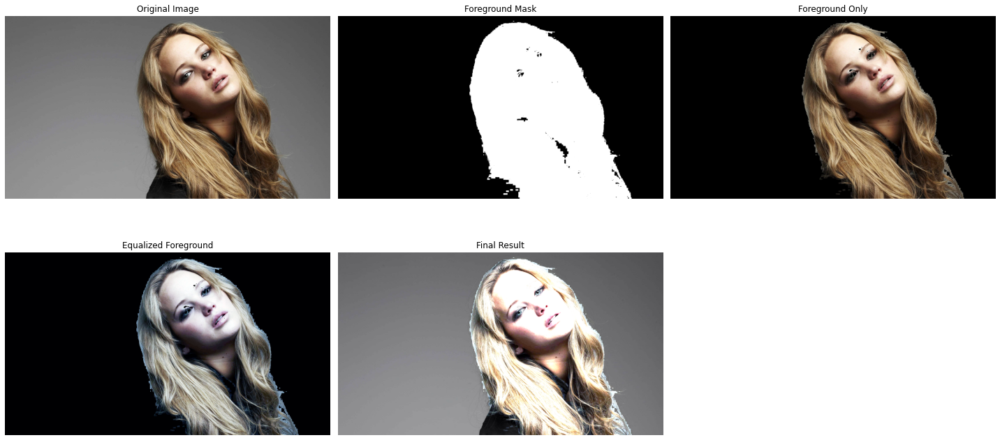

In [48]:
background = cv2.bitwise_and(img, img, mask=cv2.bitwise_not(foreground_mask.astype(np.uint8)))
result = cv2.add(equalized_foreground, background)

plt.figure(figsize=(20, 10))
plt.subplot(231)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(232)
plt.imshow(foreground_mask, cmap='gray')
plt.title('Foreground Mask')
plt.axis('off')

plt.subplot(233)
plt.imshow(cv2.cvtColor(foreground_only, cv2.COLOR_BGR2RGB))
plt.title('Foreground Only')
plt.axis('off')

plt.subplot(234)
plt.imshow(cv2.cvtColor(equalized_foreground, cv2.COLOR_BGR2RGB))
plt.title('Equalized Foreground')
plt.axis('off')

plt.subplot(235)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Final Result')
plt.axis('off')

plt.tight_layout()
plt.show()


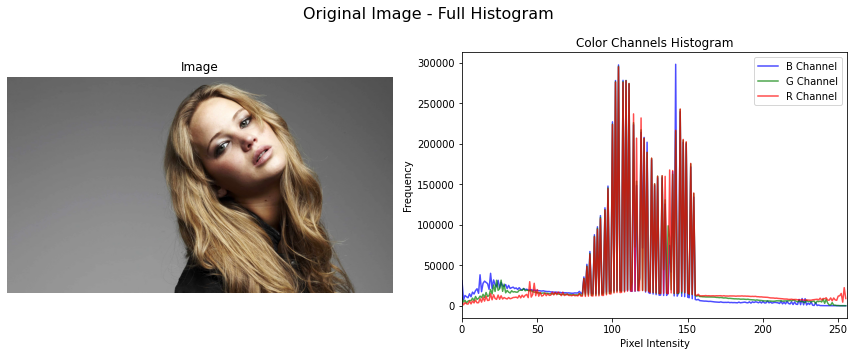

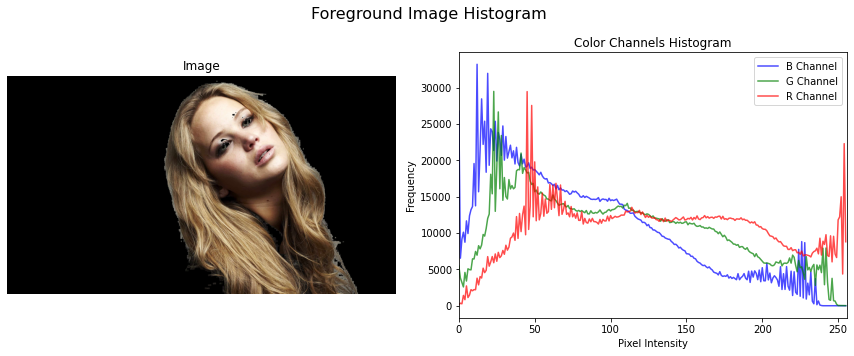

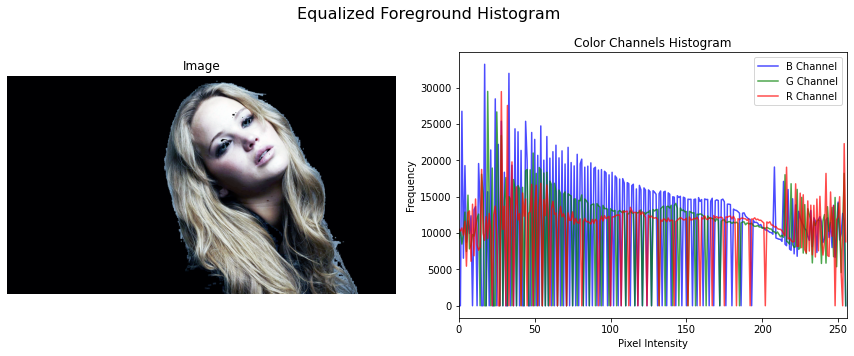

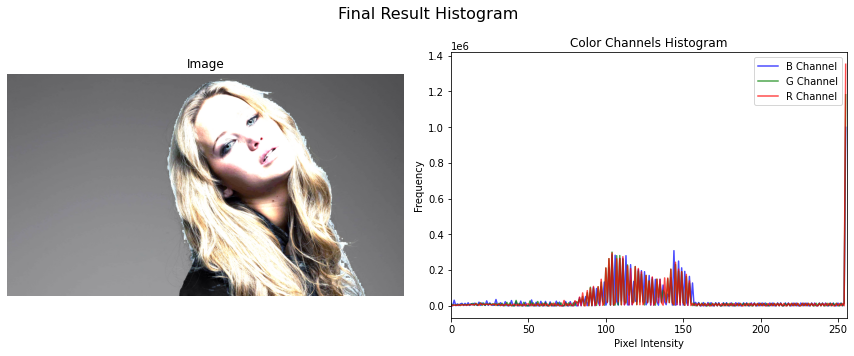

In [51]:
def display_image_histogram(image, mask=None, title="Image Histogram"):
    is_color = len(image.shape) == 3 and image.shape[2] == 3
    
    # Create subplots with a smaller figure size
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))  # Adjusted figure size here
    fig.suptitle(title, fontsize=16)
    
    # Display the image
    if is_color:
        ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else:
        ax1.imshow(image, cmap='gray')
    ax1.set_title("Image")
    ax1.axis('off')
    
    # Calculate and display histogram(s)
    if is_color:
        colors = ('b', 'g', 'r')
        for i, color in enumerate(colors):
            hist = cv2.calcHist([image], [i], mask, [256], [0, 256])
            ax2.plot(hist, color=color, alpha=0.7, label=f'{color.upper()} Channel')
        ax2.set_title("Color Channels Histogram")
    else:
        hist = cv2.calcHist([image], [0], mask, [256], [0, 256])
        ax2.plot(hist, color='gray', alpha=0.7)
        ax2.set_title("Grayscale Histogram")
    
    ax2.set_xlim([0, 256])
    ax2.set_xlabel('Pixel Intensity')
    ax2.set_ylabel('Frequency')
    if is_color:
        ax2.legend()
    
    plt.tight_layout()
    plt.show()

# Usage examples with smaller image displays
display_image_histogram(img, title="Original Image - Full Histogram")
display_image_histogram(foreground_only, mask=foreground_mask.astype(np.uint8), title="Foreground Image Histogram")
display_image_histogram(equalized_foreground, mask=foreground_mask.astype(np.uint8), title="Equalized Foreground Histogram")
display_image_histogram(result, title="Final Result Histogram")

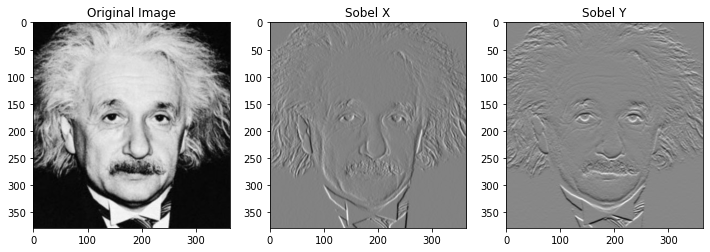

In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt


image = cv.imread('a1images/einstein.png', cv.IMREAD_GRAYSCALE)


sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

filtered_x = cv.filter2D(image, cv.CV_64F, sobel_x)
filtered_y = cv.filter2D(image, cv.CV_64F, sobel_y)

sobel_magnitude = np.sqrt(filtered_x**2 + filtered_y**2)
sobel_magnitude = np.clip(sobel_magnitude, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(filtered_x, cmap='gray')
plt.title('Sobel X')

plt.subplot(1, 3, 3)
plt.imshow(filtered_y, cmap='gray')
plt.title('Sobel Y')

plt.show()


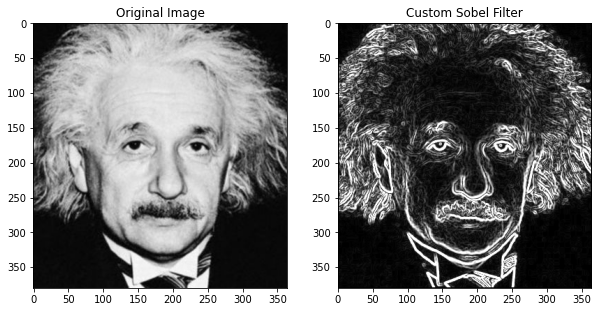

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

def custom_sobel(image):
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

    height, width = image.shape
    grad_x = np.zeros((height, width), dtype=np.float32)
    grad_y = np.zeros((height, width), dtype=np.float32)

    for i in range(1, height-1):
        for j in range(1, width-1):
            region = image[i-1:i+2, j-1:j+2]
            grad_x[i, j] = np.sum(sobel_x * region)
            grad_y[i, j] = np.sum(sobel_y * region)

    magnitude = np.sqrt(grad_x**2 + grad_y**2)
    magnitude = np.clip(magnitude, 0, 255).astype(np.uint8)
    
    return magnitude

image = cv.imread('a1images/einstein.png', cv.IMREAD_GRAYSCALE)
sobel_filtered = custom_sobel(image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(sobel_filtered, cmap='gray')
plt.title('Custom Sobel Filter')

plt.show()


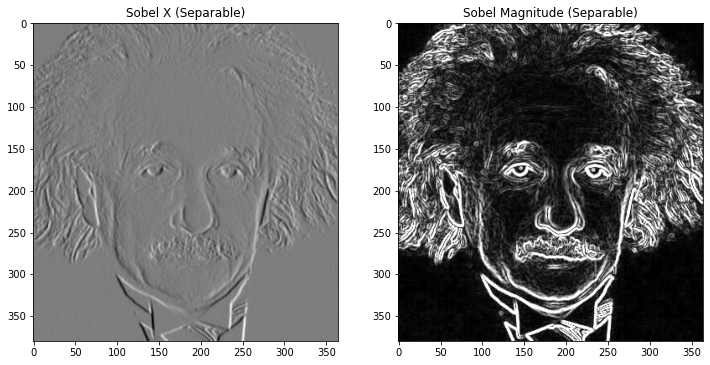

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image = cv.imread('a1images/einstein.png', cv.IMREAD_GRAYSCALE)

sobel_vertical = np.array([[1], [2], [1]])
sobel_horizontal = np.array([[1, 0, -1]])

temp_x = cv.filter2D(image, cv.CV_64F, sobel_vertical)
filtered_x = cv.filter2D(temp_x, cv.CV_64F, sobel_horizontal)

temp_y = cv.filter2D(image, cv.CV_64F, sobel_horizontal.T)
filtered_y = cv.filter2D(temp_y, cv.CV_64F, sobel_vertical.T)

sobel_magnitude = np.sqrt(filtered_x**2 + filtered_y**2)
sobel_magnitude = np.clip(sobel_magnitude, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(filtered_x, cmap='gray')
plt.title('Sobel X (Separable)')

plt.subplot(1, 2, 2)
plt.imshow(sobel_magnitude, cmap='gray')
plt.title('Sobel Magnitude (Separable)')

plt.show()


qfdewklfuesbfiesnfewinufujewfewf

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def image_zoom_compare(large_image_path, small_image_path, factor=4, size_check=False):
  
    large_img = cv.imread(large_image_path)
    small_img = cv.imread(small_image_path)
    
    if large_img is None or small_img is None:
        raise ValueError("Image loading failed. Please check the file paths.")
    
    zoomed_nn = resize_image(small_img, factor, interpolation=cv.INTER_NEAREST)
    zoomed_bl = resize_image(small_img, factor, interpolation=cv.INTER_LINEAR)
    
   
    ssd_nn = calculate_ssd(large_img, zoomed_nn, size_check=size_check)
    ssd_bl = calculate_ssd(large_img, zoomed_bl, size_check=size_check)
    
    plt.figure(figsize=(20, 8))
    
    plt.subplot(1, 3, 1)
    plt.imshow(cv.cvtColor(large_img, cv.COLOR_BGR2RGB))
    plt.title('Original Large Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(cv.cvtColor(zoomed_nn, cv.COLOR_BGR2RGB))
    plt.title(f'Nearest Neighbor Zoom, SSD={ssd_nn:.4f}')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(cv.cvtColor(zoomed_bl, cv.COLOR_BGR2RGB))
    plt.title(f'Bilinear Zoom, SSD={ssd_bl:.4f}')
    plt.axis('off')
    
    plt.show()

def resize_image(img, factor, interpolation):
    new_dimensions = (int(img.shape[1] * factor), int(img.shape[0] * factor))
    return cv.resize(img, new_dimensions, interpolation=interpolation)

def calculate_ssd(img1, img2, size_check=True):
    if not size_check:
        assert img1.shape == img2.shape, "Image dimensions must match for SSD computation."
    else:
        min_height, min_width = min(img1.shape[0], img2.shape[0]), min(img1.shape[1], img2.shape[1])
        img1, img2 = img1[:min_height, :min_width], img2[:min_height, :min_width]
    
    ssd = np.sum((img1.astype('float32') - img2.astype('float32')) ** 2)
    return ssd / np.prod(img1.shape)



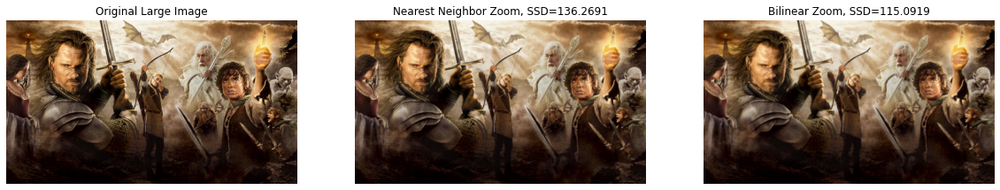

In [ ]:
large_image_path1 = r'a1images/a1q5images/im01.png'
small_image_path1 = r'a1images/a1q5images/im01small.png'

image_zoom_compare(large_image_path1, small_image_path1, factor=4, size_check=True)


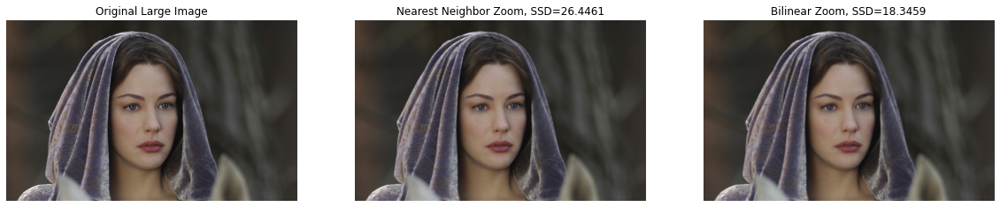

In [ ]:
large_image_path1 = r'a1images/a1q5images/im02.png'
small_image_path1 = r'a1images/a1q5images/im02small.png'

image_zoom_compare(large_image_path1, small_image_path1, factor=4, size_check=True)

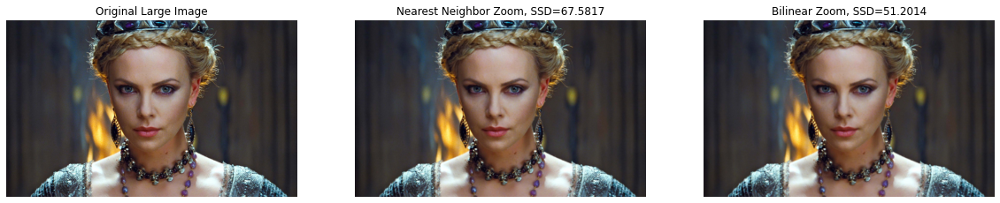

In [ ]:
large_image_path1 = r'a1images/a1q5images/im03.png'
small_image_path1 = r'a1images/a1q5images/im03small.png'

image_zoom_compare(large_image_path1, small_image_path1, factor=4, size_check=True)

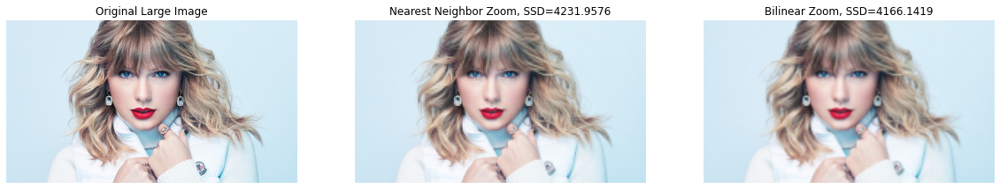

In [ ]:
large_image_path1 = r'a1images/a1q5images/taylor.jpg'
small_image_path1 = r'a1images/a1q5images/taylor_small.jpg'

image_zoom_compare(large_image_path1, small_image_path1, factor=4, size_check=True)

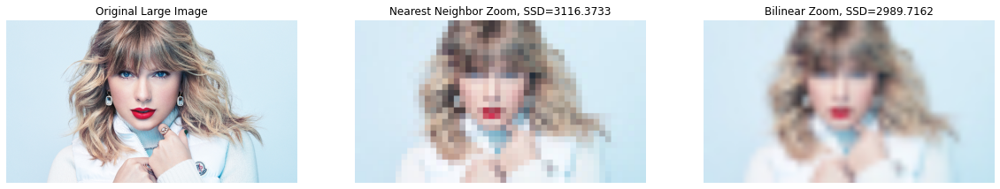

In [ ]:
large_image_path1 = r'a1images/a1q5images/taylor.jpg'
small_image_path1 = r'a1images/a1q5images/taylor_very_small.jpg'

image_zoom_compare(large_image_path1, small_image_path1, factor=4, size_check=True)

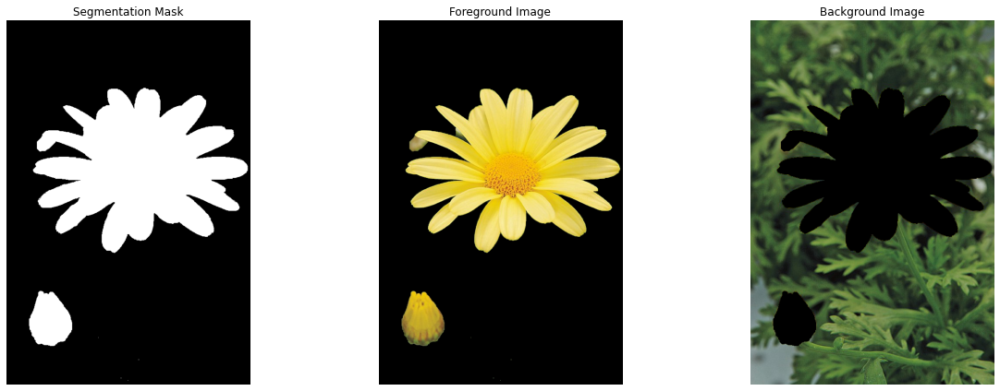

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

daisy_img = cv2.imread("a1images/daisy.jpg")
daisy_img_rgb = cv2.cvtColor(daisy_img, cv2.COLOR_BGR2RGB)

mask = np.zeros(daisy_img.shape[:2], np.uint8)
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)
rect = (50, 50, daisy_img.shape[1]-50, daisy_img.shape[0]-50)


cv2.grabCut(daisy_img, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
foreground = daisy_img_rgb * mask2[:, :, np.newaxis]
background = daisy_img_rgb * (1 - mask2[:, :, np.newaxis])

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(mask2, cmap='gray')
ax[0].set_title('Segmentation Mask')
ax[0].axis('off')

ax[1].imshow(foreground)
ax[1].set_title('Foreground Image')
ax[1].axis('off')

ax[2].imshow(background)
ax[2].set_title('Background Image')
ax[2].axis('off')

plt.tight_layout()
plt.show()

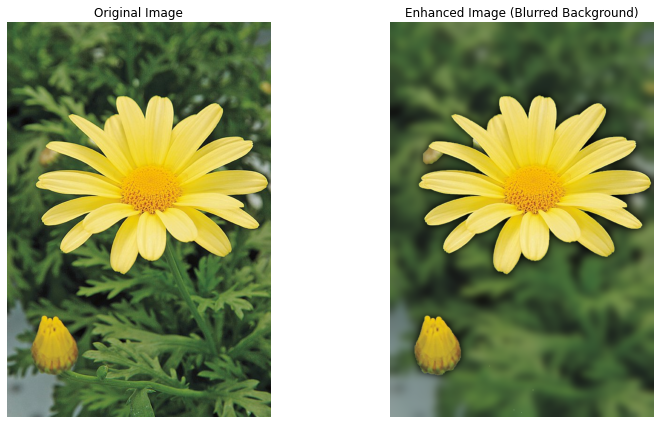

In [ ]:
blurred_background = cv2.GaussianBlur(background, (55, 55), 0)
enhanced_image = np.where(mask2[:, :, np.newaxis] == 1, daisy_img_rgb, blurred_background)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(daisy_img_rgb)
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(enhanced_image)
ax[1].set_title('Enhanced Image (Blurred Background)')
ax[1].axis('off')

plt.tight_layout()
plt.show()